In [1]:
import numpy as np
import anndata as ad
import seaborn as sns, matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu
import scanpy as sc
import decoupler as dc
sc.set_figure_params(figsize=(3, 3), frameon=False)

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [14]:
def present_genes(adata, genes, verbose=True):
    """Return only the genes that exist in adata.var_names; log the rest.
    Keeps batch jobs from dying when a marker was dropped during HVG selection."""
    keep = [g for g in genes if g in adata.var_names]
    missing = [g for g in genes if g not in adata.var_names]
    if missing and verbose:
        print("skipping genes not in var_names:", missing)
    return keep

In [2]:
adata = sc.read("/rds/general/user/ztb25/home/PBMC_datasets/integrated_adata_scANVI.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 880872 × 12711
    obs: 'age', 'gender', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'dataset', 'sample_combined'
    var: 'feature_types', 'mt', 'gene_symbols', 'genome', 'gene_versions', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'celltypist_cell_label_coarse_colors', 'celltypist_cell_label_fine_colors', 'dataset_colors', 'hvg', 'neighbors', 'pca', 'sample_combined_colors', 'scANVI', 'umap'
    obsm: 'X_pca', 'X_scANVI', 'X_umap_scANVI', 'X_umap_unintegrated'
    varm: 'PCs'
    layers: 'counts', 'log1p_norm'
    obsp: 'connectivities', 'connectivities_unintegrated', 'distances', 'distances_unintegrated', 'scAN

In [4]:
# Bringing back diagnosis column, needed for composition analysis, that got dropped at concatenation.

# the per-dataset files 
files = {
    "1": "/rds/general/user/ztb25/home/PBMC_datasets/1/PBMC1_clustering.h5ad",
    "4": "/rds/general/user/ztb25/home/PBMC_datasets/4/PBMC4_clustering.h5ad",
    "5": "/rds/general/user/ztb25/home/PBMC_datasets/5/PBMC5_clustering.h5ad",
    "6": "/rds/general/user/ztb25/home/PBMC_datasets/6/PBMC6_clustering.h5ad",
}

diag_map = {}
for ds, path in files.items():
    a = ad.read_h5ad(path, backed="r")
    integrated_barcodes = a.obs_names + f"-{ds}"
    if "diagnosis" in a.obs.columns:
        diags = a.obs["diagnosis"].astype(str).tolist()
    else:
        diags = ["CTRL"] * a.n_obs          # dataset 6 — no column, all controls
    diag_map.update(dict(zip(integrated_barcodes, diags)))
    a.file.close()

adata.obs["diagnosis"] = adata.obs_names.map(diag_map)

In [5]:
import gc
del diag_map                
try:
    del a                    
except NameError:
    pass
gc.collect()

adata.obs["diagnosis"] = adata.obs["diagnosis"].astype("category")


In [6]:
# ## monocytes lineage

# monocytes = ["Classical monocytes", "Non-classical monocytes"]
# adata_mono = adata[adata.obs["celltypist_cell_label_fine"].isin(monocytes)].copy()

# adata_mono


In [7]:
# trying with coarse label

adata_mono = adata[adata.obs["celltypist_cell_label_coarse"] == "Monocytes"].copy()

In [8]:
adata_mono.obs["celltypist_cell_label_fine"].value_counts()


celltypist_cell_label_fine
Classical monocytes        99931
Non-classical monocytes    27627
Monocytes                    214
Naive B cells                 53
Name: count, dtype: int64

In [9]:
# Drop contamination (Naive B cells) from monocytes cluster

monocyte_fine = ["Classical monocytes", "Non-classical monocytes", "Monocytes"]
adata_mono = adata_mono[adata_mono.obs["celltypist_cell_label_fine"].isin(monocyte_fine)].copy()


In [10]:
#### Subclustering monocytes to see if we can get a better trajectory/labels (intermediate states)

# ---------------------------------------------------------------
# 1. Neighbour graph on the BATCH-CORRECTED latent, monocytes only.
#    Reusing scANVI (not a fresh PCA) keeps datasets mixed instead of
#    letting batch masquerade as a subcluster.
# ---------------------------------------------------------------
sc.pp.neighbors(adata_mono, use_rep="X_scANVI", n_neighbors=15)


/var/tmp/pbs.3621012.pbs-7/ipykernel_1332763/836996867.py:10: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_mono, resolution=res, key_added=f"mono_leiden_{res}")


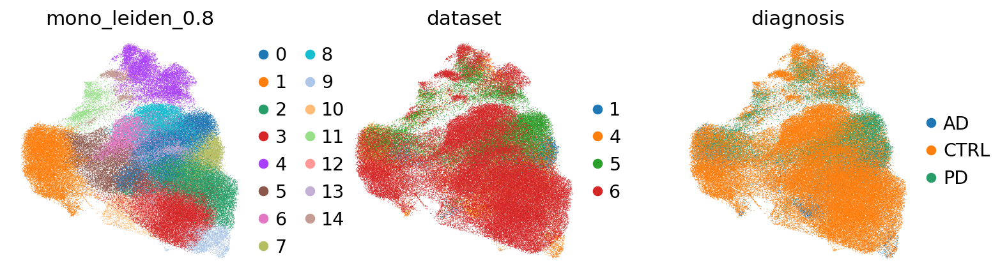

In [11]:
# ---------------------------------------------------------------
# 2. Leiden at several resolutions. Intermediate monocytes are a
#    SMALL bridge population, so they only appear once resolution is
#    high enough to split the main cloud — but too high shatters the
#    continuum. Sweep and inspect rather than trusting one value.
# ---------------------------------------------------------------
for res in [
   #0.2, 0.4, 0.6, # saving rerun time
    0.8]:
    sc.tl.leiden(adata_mono, resolution=res, key_added=f"mono_leiden_{res}")

sc.tl.umap(adata_mono)

sc.pl.umap(
    adata_mono,
    color=[
        #"mono_leiden_0.2", "mono_leiden_0.4", "mono_leiden_0.6", 
           "mono_leiden_0.8",
           "dataset", "diagnosis"],           # dataset/diagnosis: check clusters aren't batch/condition artefacts
    ncols=3,
)


missing: ['HLA-DRA']


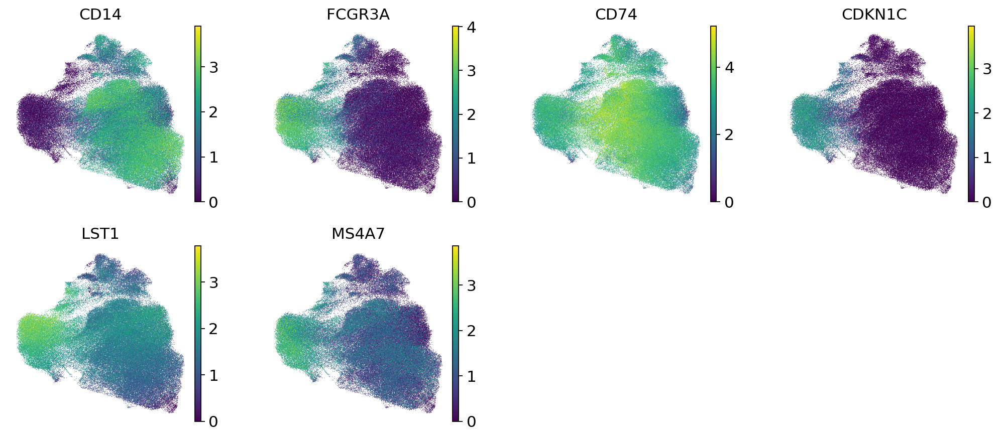

In [12]:
# ---------------------------------------------------------------
# 3. Overlay the maturation-axis markers to locate the intermediate cluster.
#    Classical:    CD14 high, FCGR3A (CD16) low
#    Intermediate: CD14 high  AND FCGR3A present, high MHC-II (HLA-DRA/CD74)
#    Non-classical:CD14 low,  FCGR3A high, CDKN1C / LST1 / MS4A7 high
# ---------------------------------------------------------------


markers = ["CD14","FCGR3A","HLA-DRA","CD74",            # classical / intermediate signal
           "CDKN1C","LST1","MS4A7"]                     # non-classical signal
present = [g for g in markers if g in adata_mono.var_names]
missing = [g for g in markers if g not in adata_mono.var_names]
print("missing:", missing)
sc.pl.umap(adata_mono, color=present, layer="log1p_norm", ncols=4)


skipping genes not in var_names: ['HLA-DRA']


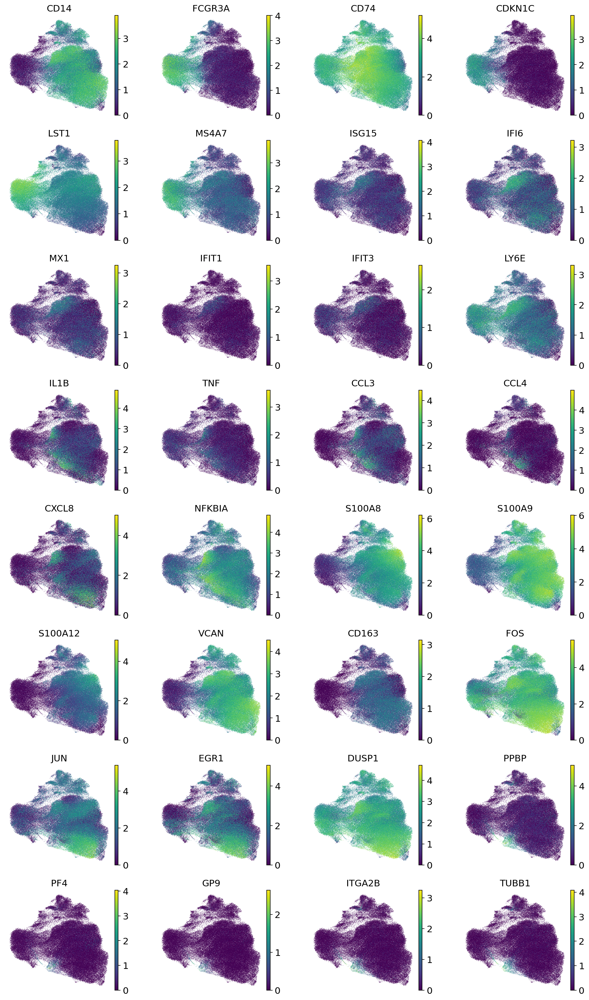

In [15]:
markers = [
    # ---- MATURATION AXIS ----
    "CD14", "FCGR3A", "HLA-DRA", "CD74",          # classical / intermediate signal
    "CDKN1C", "LST1", "MS4A7",                    # non-classical signal

    # ---- IFN-RESPONSIVE / ISG-high state (most relevant to PD inflammation) ----
    "ISG15", "IFI6", "MX1", "IFIT1", "IFIT3", "LY6E",   # type-I interferon-stimulated genes

    # ---- INFLAMMATORY / NF-kB-activated state ----
    "IL1B", "TNF", "CCL3", "CCL4", "CXCL8", "NFKBIA",   # pro-inflammatory cytokines/chemokines

    # ---- HLA-DR-low / MDSC-like immunosuppressive state ----
    # defined by LOW HLA-DRA (above) TOGETHER WITH high alarmins below
    "S100A8", "S100A9", "S100A12", "VCAN", "CD163",     # alarmin-high / suppressive monocytes

    # ---- IMMEDIATE-EARLY / STRESS (interpret with caution — see note) ----
    "FOS", "JUN", "EGR1", "DUSP1",                      # stress/activation OR dissociation artifact

    # ---- PLATELET CONTAMINATION / platelet–monocyte aggregates ----
    "PPBP", "PF4", "GP9", "ITGA2B", "TUBB1",            # NOT a monocyte state — flags doublets/contam
]

present = present_genes(adata_mono, markers)   # reuse your helper — HVG subset likely drops some
sc.pl.umap(adata_mono, color=present, layer="log1p_norm", ncols=4)


skipping genes not in var_names: ['HLA-DRA']


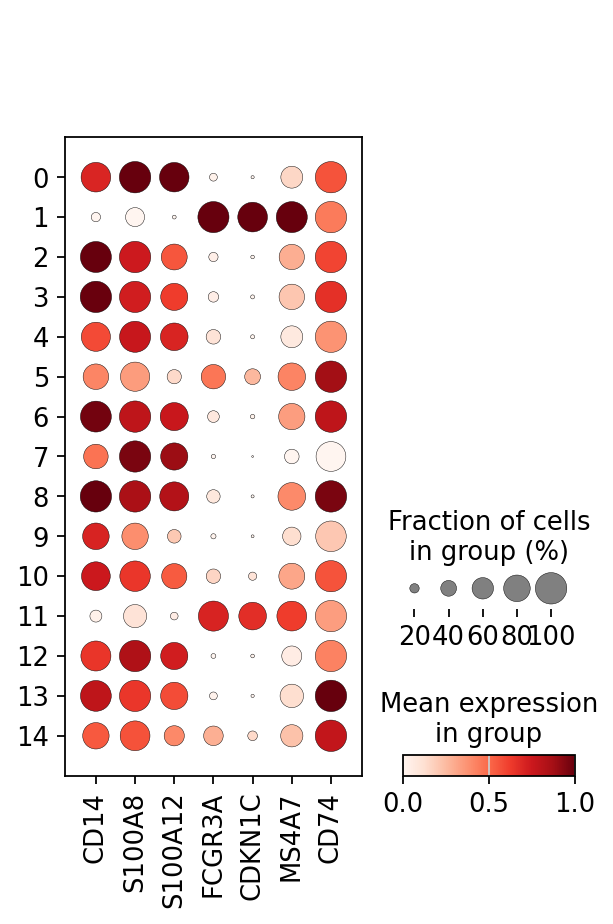

In [16]:
# ---------------------------------------------------------------
# 4. DEGs per subcluster (on log-normalised expression) to confirm identity.
#    Pick the resolution from step 2 that gives ONE coherent middle cluster.
# ---------------------------------------------------------------
chosen = "mono_leiden_0.8"       # <-- set after looking at the plots
sc.tl.rank_genes_groups(adata_mono, chosen, method="wilcoxon", use_raw=False, layer="log1p_norm")

# quick co-expression view: intermediate cells are the CD14+/FCGR3A+ double-positives
mono_markers = ["CD14", "S100A8", "S100A12",   # classical-leaning
                "FCGR3A", "CDKN1C", "MS4A7",    # non-classical-leaning
                "HLA-DRA", "CD74"]             # MHC-II, elevated in intermediate

present = [g for g in mono_markers if g in adata_mono.var_names]
missing = [g for g in mono_markers if g not in adata_mono.var_names]
if missing:
    print("skipping genes not in var_names:", missing)   # visible in the job's .out log

sc.pl.dotplot(
    adata_mono,
    var_names=present,
    groupby=chosen,
    layer="log1p_norm",
    standard_scale="var",   # matches your other clustering notebooks
)


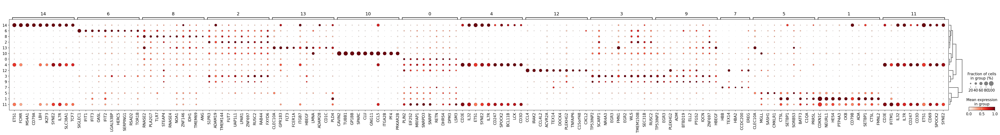

In [16]:
sc.tl.rank_genes_groups(adata_mono, "mono_leiden_0.8", method="wilcoxon", key_added="dea08")
sc.tl.filter_rank_genes_groups(adata_mono, key="dea08", key_added="dea08_filtered",
                               min_in_group_fraction=0.2, max_out_group_fraction=0.2)
sc.pl.rank_genes_groups_dotplot(adata_mono, key="dea08_filtered",
                                n_genes=10, standard_scale="var")



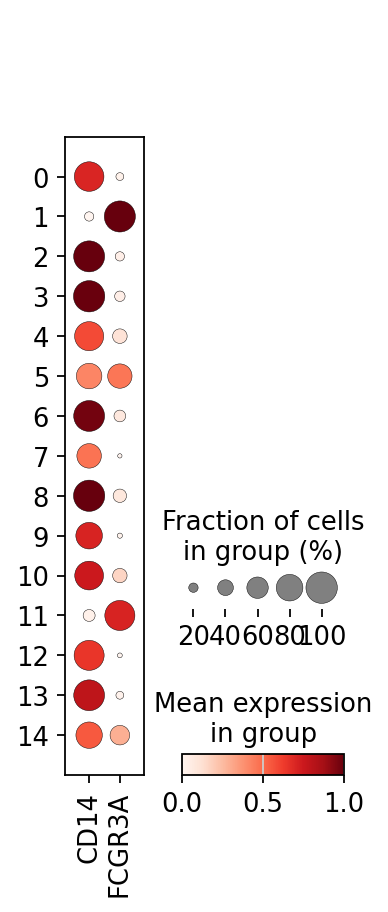

In [17]:
# check for core monocyte genes (CD14 and CD16) across all (to make sure 5 is intermediate)

sc.pl.dotplot(adata_mono, groupby="mono_leiden_0.8",
              var_names=present_genes(adata_mono,
                  ["CD14","FCGR3A"]),          
              layer="log1p_norm", standard_scale="var")


skipping genes not in var_names: ['HLA-DRA']


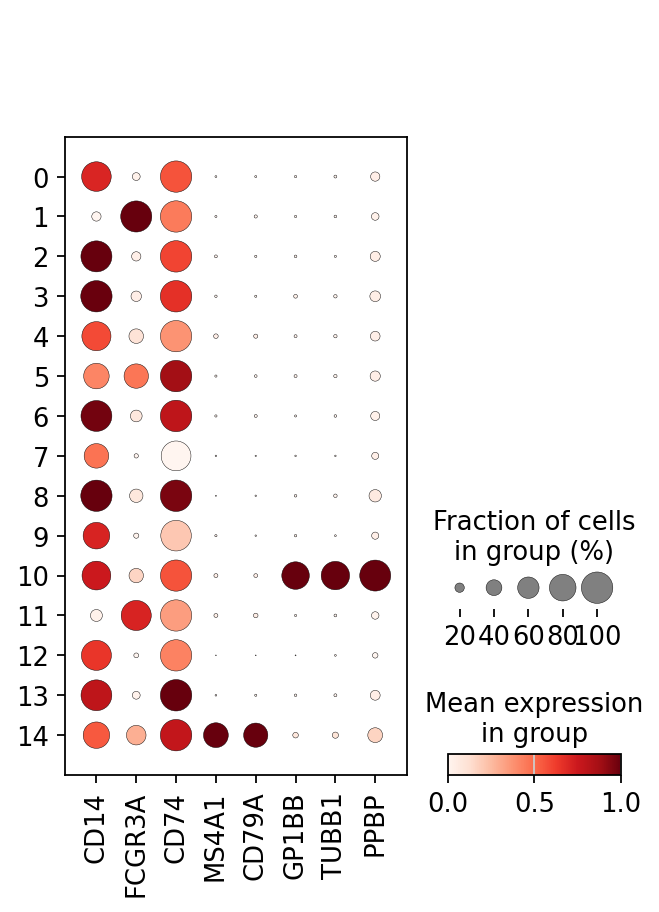

/var/tmp/pbs.3301206.pbs-7/ipykernel_3292387/376535339.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_mono.obs.groupby("mono_leiden_0.8")[["total_counts","n_genes_by_counts"]].median()


,total_counts,n_genes_by_counts
mono_leiden_0.8,,
0,6174.5,2222.0
1,7920.0,3043.0
2,7203.5,3103.0
3,8870.0,3449.0
4,9579.0,3370.5
5,9061.0,3343.0
6,8303.0,3241.0
7,2720.5,1284.5
8,8299.0,3397.5


In [18]:
sc.pl.dotplot(adata_mono, groupby="mono_leiden_0.8",
    var_names=present_genes(adata_mono,
        ["CD14","FCGR3A","HLA-DRA","CD74",          # monocyte / intermediate
         "MS4A1","CD79A",                            # B program
         "GP1BB","TUBB1","PPBP"]),                   # platelet program
    layer="log1p_norm", standard_scale="var")

# doublets have elevated counts/genes vs real monocytes
adata_mono.obs.groupby("mono_leiden_0.8")[["total_counts","n_genes_by_counts"]].median()


In [17]:
# relabel the clusters to more meaningful names based on the marker expression and DEGs

state_map = {
    "1":  "Non-classical Monocytes",
    "11": "Non-classical Monocytes",
    "5":  "Intermediate Monocytes",
    "6":  "IFN-responsive Monocytes",
    "10": "Megakaryocyte-like Monocytes",
    "12": "Inflammatory Monocytes",
    "14": "B-like Monocytes",
    # every other cluster (0,2,3,4,7,8,9,11,13) falls through to Classical
}
adata_mono.obs["mono_state"] = (
    adata_mono.obs["mono_leiden_0.8"].astype(str)
    .map(state_map).fillna("Classical Monocytes").astype("category")
)
print(adata_mono.obs["mono_state"].value_counts())




mono_state
Classical Monocytes             81987
Non-classical Monocytes         20679
Intermediate Monocytes           9783
IFN-responsive Monocytes         8255
Megakaryocyte-like Monocytes     2804
Inflammatory Monocytes           2641
B-like Monocytes                 1623
Name: count, dtype: int64


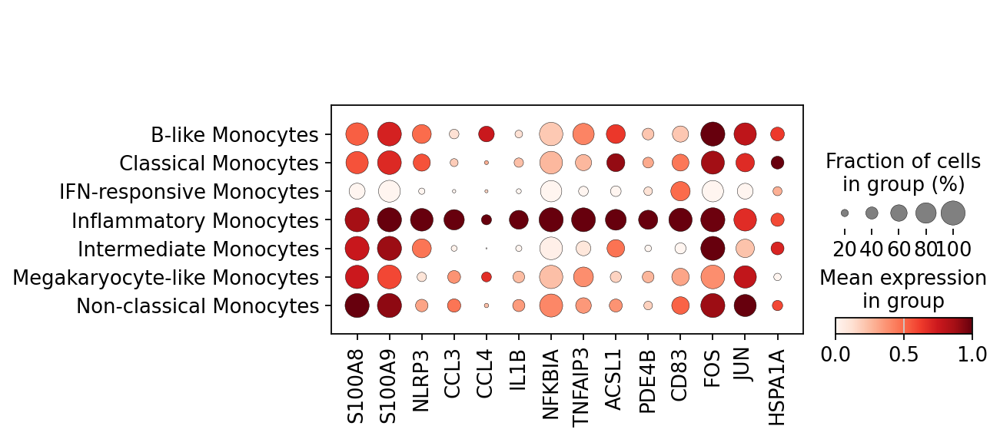

In [16]:
# Checking inflammatory markers (to check cluster 12 is inflammatory)

sc.pl.dotplot(adata_mono, groupby="mono_state",
    var_names=present_genes(adata_mono, [
        # reference paper's inflammatory markers
        "S100A8","S100A9","NLRP3","CCL3","CCL4",
        # your cluster's defining genes
        "IL1B","NFKBIA","TNFAIP3","ACSL1","PDE4B","CD83",
        # rule-out: dissociation stress
        "FOS","JUN","HSPA1A"]),
    layer="log1p_norm", standard_scale="var")


/var/tmp/pbs.3621012.pbs-7/ipykernel_1332763/931071569.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  top_genes = top.groupby("group").head(n)["names"].unique().tolist()  # flat, in cluster order


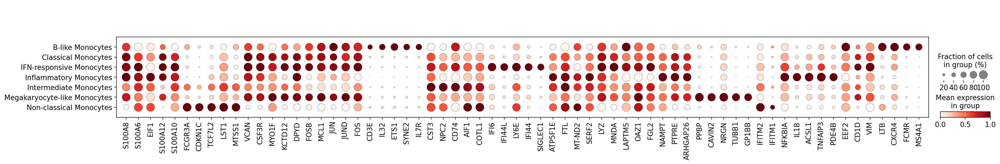

In [18]:
# Final visualisation dotplot

n = 5
top = sc.get.rank_genes_groups_df(adata_mono, group=None)          # reads cached ranking
top_genes = top.groupby("group").head(n)["names"].unique().tolist()  # flat, in cluster order

sc.pl.dotplot(
    adata_mono, var_names=top_genes, groupby="mono_state",
    standard_scale="var", dendrogram=False,
)


skipping genes not in var_names: ['HLA-DRA', 'HLA-DPB1']
skipping genes not in var_names: ['IGHM']


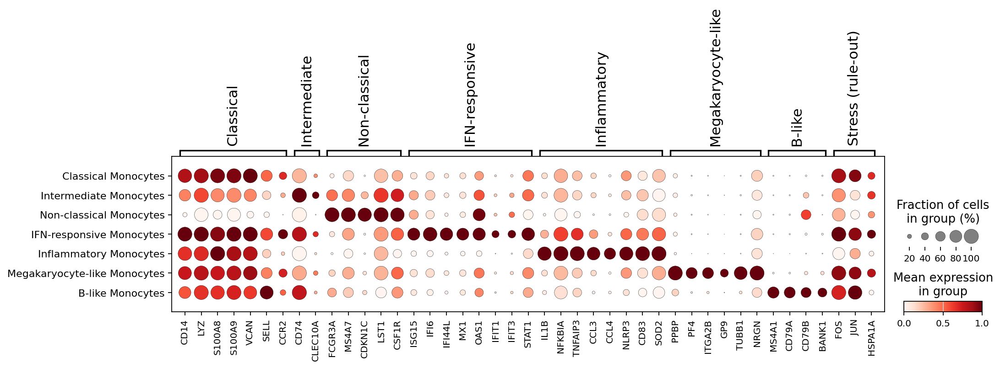

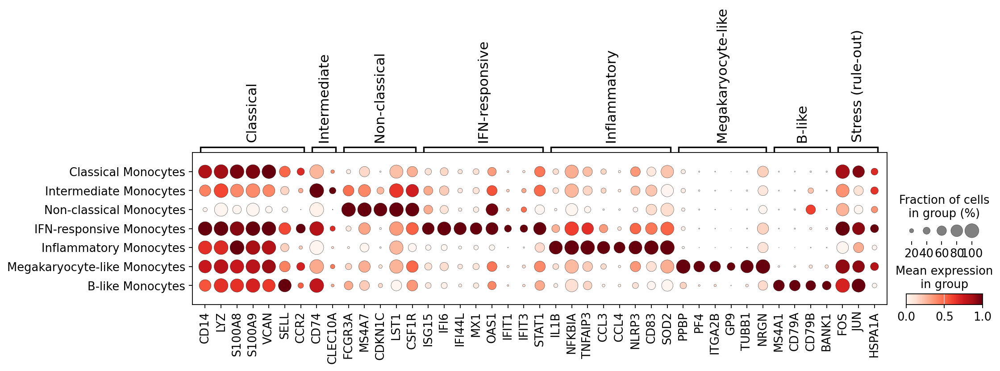

In [ ]:
# Marker panel keyed to the names in `state_map` — each block is the evidence
# that gave that subcluster its name. Grouping as a dict makes scanpy draw
# the labelled brackets above the columns.
state_markers = {
    "Classical":          ["CD14", "LYZ", "S100A8", "S100A9", "VCAN", "SELL", "CCR2"],
    "Intermediate":       ["HLA-DRA", "HLA-DPB1", "CD74", "CLEC10A"],   # CD14+CD16+, MHC-II high
    "Non-classical":      ["FCGR3A", "MS4A7", "CDKN1C", "LST1", "CSF1R"],
    "IFN-responsive":     ["ISG15", "IFI6", "IFI44L", "MX1", "OAS1", "IFIT1", "IFIT3", "STAT1"],
    "Inflammatory":       ["IL1B", "NFKBIA", "TNFAIP3", "CCL3", "CCL4", "NLRP3", "CD83", "SOD2"],
    "Megakaryocyte-like": ["PPBP", "PF4", "ITGA2B", "GP9", "TUBB1", "NRGN"],
    "B-like":             ["MS4A1", "CD79A", "CD79B", "IGHM", "BANK1"],
}

markers_present = {
    block: present_genes(adata_mono, genes) for block, genes in state_markers.items()
}
markers_present = {k: v for k, v in markers_present.items() if v}

# rows in the same order as the marker blocks, so the strong dots fall on the diagonal
state_order = [
    "Classical Monocytes", "Intermediate Monocytes", "Non-classical Monocytes",
    "IFN-responsive Monocytes", "Inflammatory Monocytes",
    "Megakaryocyte-like Monocytes", "B-like Monocytes",
]
observed = adata_mono.obs["mono_state"].astype(str).unique().tolist()
state_order = [s for s in state_order if s in observed] + \
              [s for s in observed if s not in state_order]
adata_mono.obs["mono_state"] = pd.Categorical(
    adata_mono.obs["mono_state"].astype(str), categories=state_order, ordered=True
)

FS_TICK, FS_LABEL, FS_LEGEND = 9, 10, 9

dp = sc.pl.dotplot(
    adata_mono,
    var_names=markers_present,
    groupby="mono_state",
    layer="log1p_norm",       # explicit, as in your cell 19
    use_raw=False,
    standard_scale="var",
    dendrogram=False,
    figsize=(sum(len(v) for v in markers_present.values()) * 0.26 + 3.0, 2.8),
    return_fig=True,
)
dp.legend(width=1.4)

axes = dp.get_axes()
axes["mainplot_ax"].tick_params(axis="x", labelsize=FS_TICK, rotation=90)
axes["mainplot_ax"].tick_params(axis="y", labelsize=FS_LABEL)
for key in ("color_legend_ax", "size_legend_ax"):
    if key in axes:
        axes[key].tick_params(labelsize=FS_LEGEND)

dp.savefig("figures/mono_state_markers.pdf", bbox_inches="tight")


In [22]:
# contamination = ["Platelet-contam"]
# adata_mono = adata_mono[~adata_mono.obs["mono_state"].isin(contamination)].copy()
# # adata_mono now = all REAL monocytes (5 states)

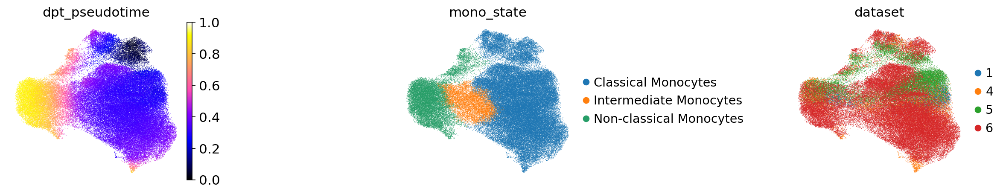

In [23]:
# Pseudotime anlysis, on main three trajectory groups (Classical, Intermediate, Non-classical)

maturation_groups = ["Classical Monocytes", "Intermediate Monocytes", "Non-classical Monocytes"]
adata_traj = adata_mono[adata_mono.obs["mono_state"].isin(maturation_groups)].copy()

# cells changed at step 2 -> recompute graph
sc.pp.neighbors(adata_traj, use_rep="X_scANVI", n_neighbors=15)
sc.tl.diffmap(adata_traj)

# root = robust high-CD14 Classical cell (still root on the maturation start)
# cd14 = adata_traj[:, "CD14"].layers["log1p_norm"]
# cd14 = cd14.toarray().ravel() if issparse(cd14) else np.asarray(cd14).ravel()
# is_classical = (adata_mono.obs["mono_state"] == "Classical").values
# top = np.argsort(np.where(is_classical, cd14, -np.inf))[-50:]
# adata_mono.uns["iroot"] = int(top[np.argmin(np.abs(cd14[top] - np.median(cd14[top])))])

adata_traj.uns["iroot"] = np.flatnonzero(adata_traj.obs["mono_state"] == "Classical Monocytes")[0]

sc.tl.dpt(adata_traj)
sc.tl.umap(adata_traj)

sc.pl.embedding(adata_traj, basis="umap",
                color=["dpt_pseudotime", "mono_state", "dataset"],
                color_map="gnuplot2",
                wspace = 1.0
                )


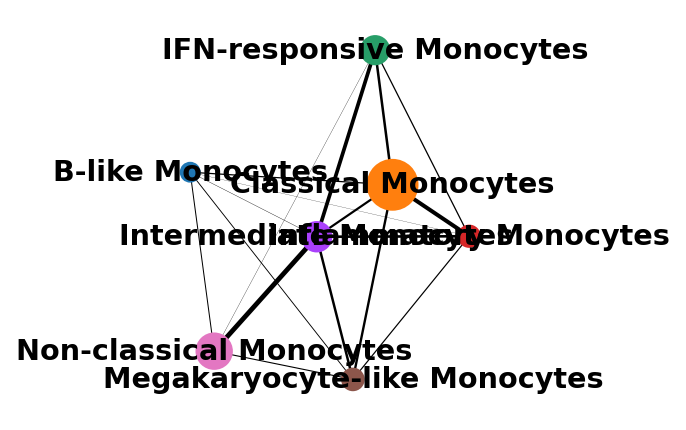

In [24]:
sc.tl.paga(adata_mono, groups="mono_state")
sc.pl.paga(adata_mono, color="mono_state")          # topology: who connects to whom

In [25]:
# ============================================================
# Compositional analysis of monocyte substates (scanpro)
# Run on adata_mono = the CLEANED object (contamination removed,
# 5 states labelled in mono_state). Proportions are computed
# WITHIN the monocyte compartment, i.e. "of a donor's monocytes,
# what fraction are IFN-activated / Inflammatory / Intermediate / ..."
# ============================================================
from scanpro.scanpro import scanpro

# make sure the grouping cols are the right dtype
adata_mono.obs["mono_state"] = adata_mono.obs["mono_state"].astype("category")
adata_mono.obs["diagnosis"]  = adata_mono.obs["diagnosis"].astype("category")

# sanity check what's actually present before testing
print(adata_mono.obs["diagnosis"].value_counts())
print(adata_mono.obs["mono_state"].value_counts())



diagnosis
CTRL    96975
PD      22437
AD       8360
Name: count, dtype: int64
mono_state
Classical Monocytes             81987
Non-classical Monocytes         20679
Intermediate Monocytes           9783
IFN-responsive Monocytes         8255
Megakaryocyte-like Monocytes     2804
Inflammatory Monocytes           2641
B-like Monocytes                 1623
Name: count, dtype: int64


In [26]:
# ---- main scanpro run (all conditions), same call style as your integrated notebook ----
out = scanpro(
    adata_mono,
    samples_col="sample_combined",
    clusters_col="mono_state",
    conds_col="diagnosis",
)   # default logit transformation, as before

out.results


[INFO] There are more than 2 conditions. ANOVA will be performed...
[INFO] Done!


,baseline_props,mean_props_CTRL,mean_props_PD,mean_props_AD,f_statistics,p_values,adjusted_p_values
clusters,,,,,,,
B-like Monocytes,0.012702,0.018451,0.004603,0.004402,2.087895,1.290640e-01,1.505747e-01
Classical Monocytes,0.641666,0.596034,0.691864,0.457996,8.783708,2.969936e-04,9.728569e-04
IFN-responsive Monocytes,0.064607,0.039066,0.029791,0.011913,5.356923,6.091268e-03,1.065972e-02
Inflammatory Monocytes,0.020670,0.027804,0.000467,0.141797,27.363949,2.722287e-10,1.905601e-09
Intermediate Monocytes,0.076566,0.079006,0.082842,0.065546,0.870527,4.217308e-01,4.217308e-01
Megakaryocyte-like Monocytes,0.021945,0.020523,0.013342,0.005375,8.389001,4.169387e-04,9.728569e-04
Non-classical Monocytes,0.161843,0.219117,0.177091,0.312971,4.773735,1.036809e-02,1.451533e-02


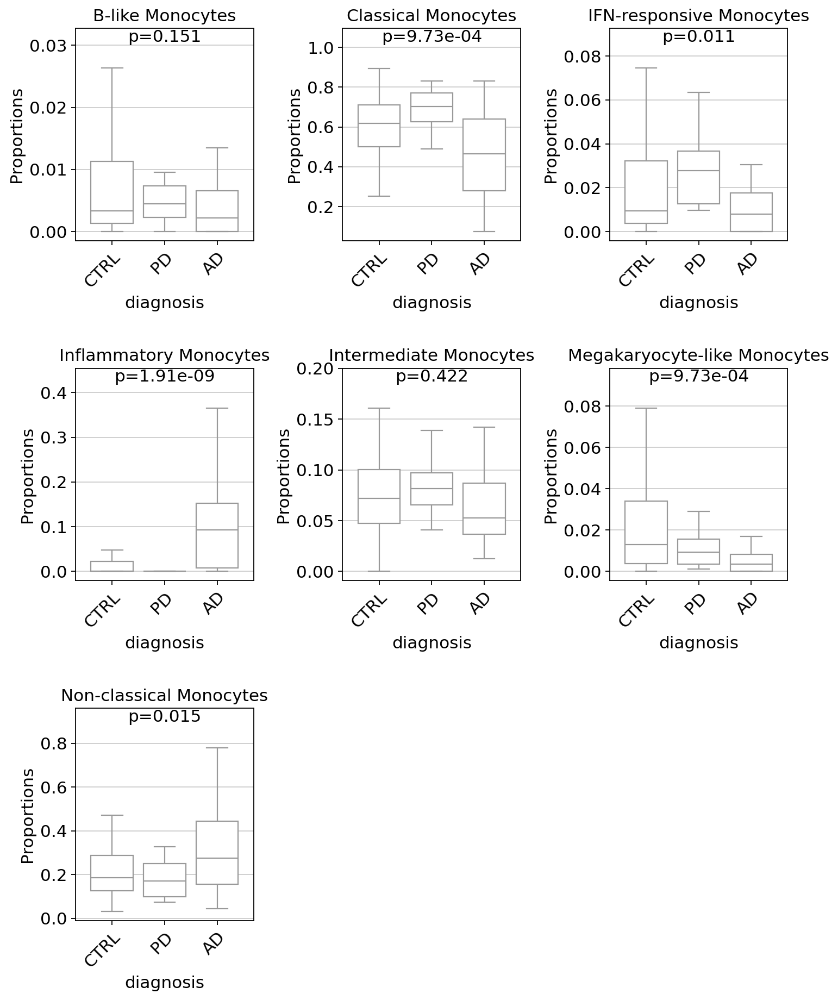

In [27]:
out.plot(kind="boxplot")


[INFO] There are 2 conditions. T-Test will be performed...
[INFO] Done!


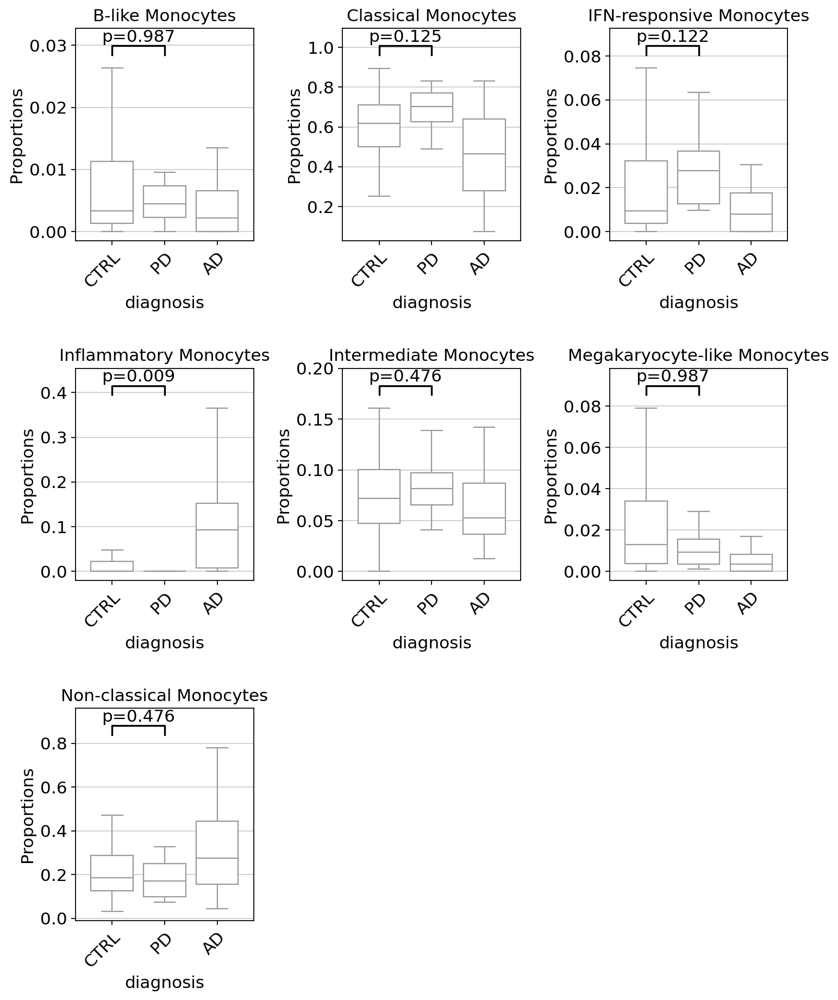

In [28]:
# ---- posthoc pairwise comparisons (mirrors your out2/out3/out4 cells) ----
# PD vs CTRL (primary comparison for your project)
out_pd = scanpro(
    adata_mono,
    samples_col="sample_combined",
    clusters_col="mono_state",
    conds_col="diagnosis",
    conditions=["PD", "CTRL"],
)

out_pd.plot(kind="boxplot")


In [29]:
out_pd.results

,baseline_props,mean_props_CTRL,mean_props_PD,prop_ratio,t_statistics,p_values,adjusted_p_values
clusters,,,,,,,
B-like Monocytes,0.012702,0.018451,0.004603,4.008726,-0.015987,0.987287,0.987287
Classical Monocytes,0.641666,0.596034,0.691864,0.861489,-1.959370,0.053770,0.125464
IFN-responsive Monocytes,0.064607,0.039066,0.029791,1.311332,-2.148477,0.034890,0.122116
Inflammatory Monocytes,0.020670,0.027804,0.000467,59.541036,3.332854,0.001335,0.009345
Intermediate Monocytes,0.076566,0.079006,0.082842,0.953688,-1.038306,0.302449,0.475757
Megakaryocyte-like Monocytes,0.021945,0.020523,0.013342,1.538276,0.017916,0.985753,0.987287
Non-classical Monocytes,0.161843,0.219117,0.177091,1.237310,0.960601,0.339827,0.475757


In [30]:
# only if "AD" appears in the value_counts above
out_ad  = scanpro(adata_mono, samples_col="sample_combined", clusters_col="mono_state",
                  conds_col="diagnosis", conditions=["AD", "CTRL"]); out_ad.results


[INFO] There are 2 conditions. T-Test will be performed...
[INFO] Done!


,baseline_props,mean_props_CTRL,mean_props_AD,prop_ratio,t_statistics,p_values,adjusted_p_values
clusters,,,,,,,
B-like Monocytes,0.012702,0.018451,0.004402,4.191453,1.899255,0.060901,0.085262
Classical Monocytes,0.641666,0.596034,0.457996,1.301396,2.945969,0.004147,0.009676
IFN-responsive Monocytes,0.064607,0.039066,0.011913,3.279363,1.750164,0.083676,0.097622
Inflammatory Monocytes,0.020670,0.027804,0.141797,0.196083,-5.043501,0.000003,0.000018
Intermediate Monocytes,0.076566,0.079006,0.065546,1.205347,0.302788,0.762786,0.762786
Megakaryocyte-like Monocytes,0.021945,0.020523,0.005375,3.818176,3.691920,0.000391,0.001369
Non-classical Monocytes,0.161843,0.219117,0.312971,0.700118,-2.448627,0.016382,0.028669


In [31]:
out_pdad = scanpro(adata_mono, samples_col="sample_combined", clusters_col="mono_state",
                  conds_col="diagnosis", conditions=["PD", "AD"]); out_pdad.results

[INFO] There are 2 conditions. T-Test will be performed...
[INFO] Done!


,baseline_props,mean_props_PD,mean_props_AD,prop_ratio,t_statistics,p_values,adjusted_p_values
clusters,,,,,,,
B-like Monocytes,0.012702,0.004603,0.004402,1.045582,1.610088,1.141693e-01,1.141693e-01
Classical Monocytes,0.641666,0.691864,0.457996,1.510635,3.825382,3.890066e-04,1.361523e-03
IFN-responsive Monocytes,0.064607,0.029791,0.011913,2.500787,3.605453,7.593087e-04,1.771720e-03
Inflammatory Monocytes,0.020670,0.000467,0.141797,0.003293,-8.970403,1.071357e-11,7.499496e-11
Intermediate Monocytes,0.076566,0.082842,0.065546,1.263881,2.122033,3.921024e-02,4.574528e-02
Megakaryocyte-like Monocytes,0.021945,0.013342,0.005375,2.482114,3.134388,2.985650e-03,5.224887e-03
Non-classical Monocytes,0.161843,0.177091,0.312971,0.565838,-2.711617,9.361790e-03,1.310651e-02


In [32]:
# 1. Confirm the zero at the cell level (not just scanpro's proportion output)
import pandas as pd
print(pd.crosstab(adata_mono.obs["mono_state"], adata_mono.obs["diagnosis"]))

# 2. Which DATASET does the inflammatory cluster come from?
print(pd.crosstab(adata_mono.obs["mono_state"], adata_mono.obs["dataset"]))

# 3. THE KEY ONE: three-way — state x dataset x diagnosis
print(adata_mono.obs.groupby(["mono_state","dataset","diagnosis"], observed=True)
      .size().unstack("diagnosis", fill_value=0))

# 4. How many DONORS have any inflammatory-activated cells, by diagnosis?
inf = adata_mono.obs[adata_mono.obs["mono_state"]=="Inflammatory-activated"]
print("donors with inflammatory cells, by diagnosis:")
print(inf.groupby("diagnosis", observed=True)["sample_combined"].nunique())
print("total donors by diagnosis:")
print(adata_mono.obs.groupby("diagnosis", observed=True)["sample_combined"].nunique())



diagnosis                       AD   CTRL     PD
mono_state                                      
B-like Monocytes                35   1491     97
Classical Monocytes           3844  62284  15859
IFN-responsive Monocytes       118   7454    683
Inflammatory Monocytes        1537   1095      9
Intermediate Monocytes         648   7355   1780
Megakaryocyte-like Monocytes    54   2486    264
Non-classical Monocytes       2124  14810   3745
dataset                          1     4      5      6
mono_state                                            
B-like Monocytes                 8    75    161   1379
Classical Monocytes           5590  9470  15840  51087
IFN-responsive Monocytes       222   394   1290   6349
Inflammatory Monocytes          11  1974      1    655
Intermediate Monocytes         908  1753   1787   5335
Megakaryocyte-like Monocytes   375   102    232   2095
Non-classical Monocytes       1343  4485   4235  10616
diagnosis                               AD   CTRL     PD
mono_st

In [ ]:
# # NOTE: use the object that actually has dpt_pseudotime (your trajectory object).
# # I keep the name adata_mono to match your existing cell; swap to adata_traj if that's where DPT ran.
# assert "dpt_pseudotime" in adata_mono.obs and "mono_state" in adata_mono.obs

# subgroup_col = "mono_state"
# # pseudotime shift is only meaningful along the maturation axis:
# subgroups = ["Classical", "Intermediate", "Non-classical"]

# # diagnosis groups present, CTRL first as the reference/baseline
# present_diag = [d for d in ["CTRL", "PD", "AD"] if d in adata_mono.obs["diagnosis"].unique()]

# # ---- 1. Faceted density plot: diagnosis groups overlaid WITHIN each maturation state ----
# fig, axes = plt.subplots(1, len(subgroups), figsize=(5 * len(subgroups), 4), sharex=True)
# for ax, sg in zip(axes, subgroups):
#     sub = adata_mono.obs[adata_mono.obs[subgroup_col] == sg]
#     sns.kdeplot(data=sub, x="dpt_pseudotime", hue="diagnosis", hue_order=present_diag,
#                 common_norm=False, fill=True, cut=0, ax=ax)   # cut=0: don't smear past [0,1]
#     ax.set_title(sg)
# plt.tight_layout(); plt.show()

# # ---- 2. Donor-level test WITHIN each subgroup, each disease vs CTRL ----
# per_donor_sg = (adata_mono.obs
#                 .groupby([subgroup_col, "sample_combined"], observed=True)
#                 .agg(median_pt=("dpt_pseudotime", "median"),
#                      diagnosis=("diagnosis", "first"),
#                      n_cells=("dpt_pseudotime", "size"))
#                 .reset_index())
# per_donor_sg = per_donor_sg[per_donor_sg["n_cells"] >= 20]   # drop unstable donor medians

# diseases = [d for d in present_diag if d != "CTRL"]          # compare each vs CTRL
# rows = []
# for sg in subgroups:
#     d = per_donor_sg[per_donor_sg[subgroup_col] == sg]
#     ctrl_vals = d.loc[d.diagnosis == "CTRL", "median_pt"]
#     for dis in diseases:
#         dis_vals = d.loc[d.diagnosis == dis, "median_pt"]
#         if len(dis_vals) < 3 or len(ctrl_vals) < 3:
#             print(f"{sg} | {dis} vs CTRL: too few donors ({dis}={len(dis_vals)}, CTRL={len(ctrl_vals)}) — skip")
#             continue
#         U, p = mannwhitneyu(dis_vals, ctrl_vals, alternative="two-sided")
#         rows.append({"subgroup": sg, "comparison": f"{dis} vs CTRL",
#                      "n_disease": len(dis_vals), "n_CTRL": len(ctrl_vals),
#                      "median_disease": round(dis_vals.median(), 3),
#                      "median_CTRL": round(ctrl_vals.median(), 3),
#                      "U": U, "p": p})

                     

# # ---- Benjamini–Hochberg across all tests run ----
# res = pd.DataFrame(rows).sort_values("p").reset_index(drop=True)
# m = len(res)
# res["p_adj"] = (res["p"] * m / (res.index + 1)).clip(upper=1.0)   # BH
# res["p_adj"] = res["p_adj"][::-1].cummin()[::-1]                  # enforce monotonicity
# print(res.to_string(index=False))


AssertionError: 

In [33]:
from scipy.stats import kruskal
import scikit_posthocs as sp
import pandas as pd

subgroup_col = "mono_state"
subgroups = ["Classical Monocytes", "Intermediate Monocytes", "Non-classical Monocytes"]

# donor-level median pseudotime per subgroup (>=20 cells, as before) — on the trajectory object
per_donor_sg = (adata_traj.obs
                .groupby([subgroup_col, "sample_combined"], observed=True)
                .agg(median_pt=("dpt_pseudotime", "median"),
                     diagnosis=("diagnosis", "first"),
                     n_cells=("dpt_pseudotime", "size"))
                .reset_index())
per_donor_sg = per_donor_sg[per_donor_sg["n_cells"] >= 20]

# ---- 1. Omnibus Kruskal–Wallis per subgroup ----
omni = []
for sg in subgroups:
    d = per_donor_sg[per_donor_sg[subgroup_col] == sg]
    groups = [g["median_pt"].values for _, g in d.groupby("diagnosis", observed=True)
              if len(g) >= 3]                       # only groups with >=3 donors
    if len(groups) < 2:
        print(f"{sg}: <2 usable groups — skip"); continue
    H, p = kruskal(*groups)
    # group medians for interpretation
    meds = d.groupby("diagnosis", observed=True)["median_pt"].median().round(3).to_dict()
    omni.append({"subgroup": sg, "H": round(H, 2), "p_kw": p, "medians": meds})

omni = pd.DataFrame(omni).sort_values("p_kw").reset_index(drop=True)
# BH-correct the omnibus p-values ACROSS the 3 subgroups
m = len(omni)
omni["p_kw_adj"] = (omni["p_kw"] * m / (omni.index + 1)).clip(upper=1.0)
omni["p_kw_adj"] = omni["p_kw_adj"][::-1].cummin()[::-1]
print(omni.to_string(index=False))

# ---- 2. Dunn's post-hoc, only where the omnibus is significant ----
for sg in omni.loc[omni["p_kw_adj"] < 0.05, "subgroup"]:
    d = per_donor_sg[per_donor_sg[subgroup_col] == sg]
    keep = d.groupby("diagnosis", observed=True)["median_pt"].transform("size") >= 3
    d = d[keep]
    print(f"\n{sg} — Dunn's post-hoc (BH-adjusted pairwise p-values):")
    print(sp.posthoc_dunn(d, val_col="median_pt", group_col="diagnosis",
                          p_adjust="fdr_bh").round(4))


               subgroup         H     p_kw                                                                             medians  p_kw_adj
    Classical Monocytes 25.570000 0.000003  {'AD': 0.30799999833106995, 'CTRL': 0.3109999895095825, 'PD': 0.27900001406669617}  0.000008
Non-classical Monocytes 19.610001 0.000055     {'AD': 0.828000009059906, 'CTRL': 0.8299999833106995, 'PD': 0.7870000004768372}  0.000083
 Intermediate Monocytes 12.730000 0.001719 {'AD': 0.35199999809265137, 'CTRL': 0.38100001215934753, 'PD': 0.43799999356269836}  0.001719

Classical Monocytes — Dunn's post-hoc (BH-adjusted pairwise p-values):
          AD   CTRL      PD
AD    1.0000  0.567  0.0001
CTRL  0.5670  1.000  0.0000
PD    0.0001  0.000  1.0000

Non-classical Monocytes — Dunn's post-hoc (BH-adjusted pairwise p-values):
          AD    CTRL      PD
AD    1.0000  0.5870  0.0001
CTRL  0.5870  1.0000  0.0001
PD    0.0001  0.0001  1.0000

Intermediate Monocytes — Dunn's post-hoc (BH-adjusted pairwise p-values):
 

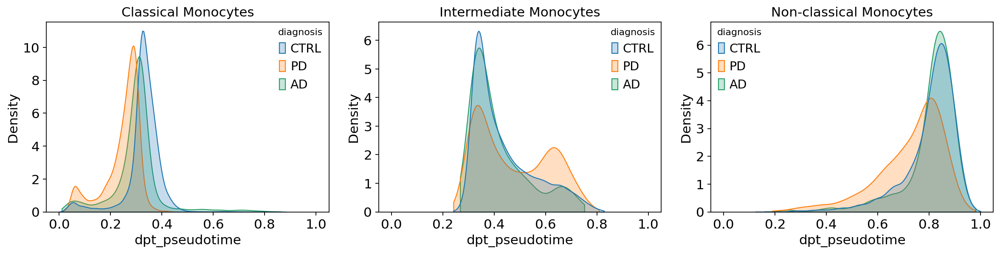

               subgroup      kw_H     kw_p  kw_p_adj comparison  median_a  median_b  dunn_p_adj
    Classical Monocytes 25.570000 0.000003  0.000008 CTRL vs PD     0.311     0.279      0.0000
    Classical Monocytes 25.570000 0.000003  0.000008 CTRL vs AD     0.311     0.308      0.5670
    Classical Monocytes 25.570000 0.000003  0.000008   PD vs AD     0.279     0.308      0.0001
 Intermediate Monocytes 12.730000 0.001719  0.001719 CTRL vs PD     0.381     0.438      0.0042
 Intermediate Monocytes 12.730000 0.001719  0.001719 CTRL vs AD     0.381     0.352      0.2206
 Intermediate Monocytes 12.730000 0.001719  0.001719   PD vs AD     0.438     0.352      0.0042
Non-classical Monocytes 19.610001 0.000055  0.000083 CTRL vs PD     0.830     0.787      0.0001
Non-classical Monocytes 19.610001 0.000055  0.000083 CTRL vs AD     0.830     0.828      0.5870
Non-classical Monocytes 19.610001 0.000055  0.000083   PD vs AD     0.787     0.828      0.0001


In [ ]:
from scipy.stats import kruskal
import scikit_posthocs as sp
import pandas as pd, itertools

subgroup_col = "mono_state"
subgroups = ["Classical Monocytes", "Intermediate Monocytes", "Non-classical Monocytes"]
present_diag = [d for d in ["CTRL", "PD", "AD"] if d in adata_traj.obs["diagnosis"].unique()]

# ---- 1. Density plots (same layout as before) ----
fig, axes = plt.subplots(1, len(subgroups), figsize=(5*len(subgroups), 4), sharex=True)
for ax, sg in zip(axes, subgroups):
    sub = adata_traj.obs[adata_traj.obs[subgroup_col] == sg]
    sns.kdeplot(data=sub, x="dpt_pseudotime", hue="diagnosis", hue_order=present_diag,
                common_norm=False, fill=True, cut=0, ax=ax)
    ax.set_title(sg)
    ax.grid(False)
plt.tight_layout(); plt.show()

# ---- 2. Donor-level medians ----
per_donor_sg = (adata_traj.obs
                .groupby([subgroup_col, "sample_combined"], observed=True)
                .agg(median_pt=("dpt_pseudotime","median"),
                     diagnosis=("diagnosis","first"),
                     n_cells=("dpt_pseudotime","size"))
                .reset_index())
per_donor_sg = per_donor_sg[per_donor_sg["n_cells"] >= 20]

# ---- 3. KW omnibus + Dunn's, flattened to ONE table ----
kw_rows, dunn_rows = [], []
for sg in subgroups:
    d = per_donor_sg[per_donor_sg[subgroup_col] == sg]
    d = d[d.groupby("diagnosis", observed=True)["median_pt"].transform("size") >= 3]
    diags = [g for g in present_diag if g in d["diagnosis"].unique()]
    if len(diags) < 2:
        print(f"{sg}: <2 usable groups — skip"); continue
    H, p_kw = kruskal(*[d.loc[d.diagnosis==g, "median_pt"].values for g in diags])
    meds = d.groupby("diagnosis", observed=True)["median_pt"].median().round(3)
    kw_rows.append({"subgroup": sg, "kw_H": round(H,2), "kw_p": p_kw})
    dunn = sp.posthoc_dunn(d, val_col="median_pt", group_col="diagnosis", p_adjust="fdr_bh")
    for a, b in itertools.combinations(diags, 2):
        dunn_rows.append({"subgroup": sg, "comparison": f"{a} vs {b}",
                          "median_a": meds[a], "median_b": meds[b],
                          "dunn_p_adj": round(dunn.loc[a, b], 4)})

# BH-correct the omnibus p across subgroups
kw = pd.DataFrame(kw_rows).sort_values("kw_p").reset_index(drop=True)
m = len(kw)
kw["kw_p_adj"] = (kw["kw_p"]*m/(kw.index+1)).clip(upper=1.0)
kw["kw_p_adj"] = kw["kw_p_adj"][::-1].cummin()[::-1]

# one flat table: each pairwise row carries its subgroup's omnibus result
res = (pd.DataFrame(dunn_rows).merge(kw, on="subgroup", how="left")
       [["subgroup","kw_H","kw_p","kw_p_adj","comparison","median_a","median_b","dunn_p_adj"]])
print(res.to_string(index=False))

In [35]:
##############################

In [ ]:
# # use scanvi latent space to infer pseudotime (batch corrected)

# sc.pp.neighbors(adata_mono, use_rep="X_scANVI") # compute neighbors on the corrected latent
# sc.tl.diffmap(adata_mono) # generates X_diffmap, which is a trajectory aware dimensionality reduction (distance in diffusion-map space ≈ how likely a cell is to transition into another cell along the manifold.)

# # set the root cell for pseudotime inference to be a classical monocyte
# adata_mono.uns["iroot"] = np.flatnonzero(
#     adata_mono.obs["celltypist_cell_label_fine"] == "Classical monocytes")[0]

# # compute pseudotime using diffusion pseudotime (DPT)
# sc.tl.dpt(adata_mono) 

# # subset-specific umap (for visualisation)
# sc.tl.umap(adata_mono)

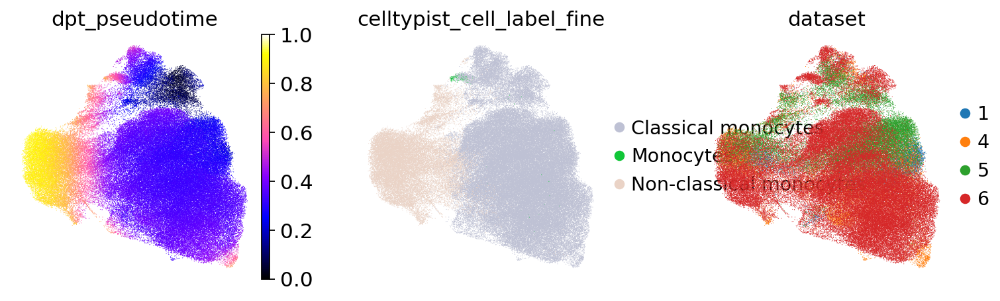

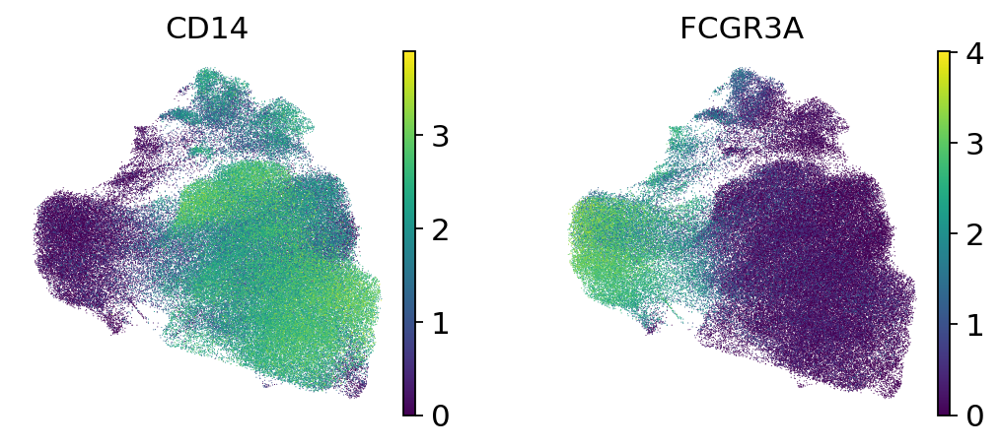

In [ ]:
# sc.pl.embedding(adata_mono, basis="umap",
#                 color=["dpt_pseudotime", "celltypist_cell_label_fine", "dataset"],
#                 color_map="gnuplot2")
# # markers should form a gradient along pseudotime; dataset should be MIXED (not segregated)
# sc.pl.embedding(adata_mono, basis="umap", color=["CD14", "FCGR3A"], layer="log1p_norm")

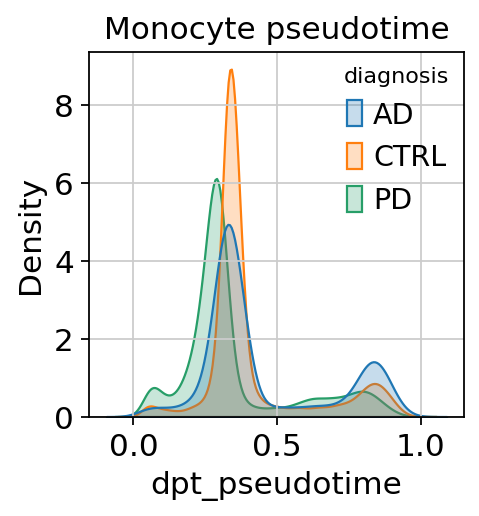

In [ ]:

# sns.kdeplot(data=adata_mono.obs, x="dpt_pseudotime", hue="diagnosis", common_norm=False, fill=True)
# plt.title("Monocyte pseudotime"); plt.show()


In [ ]:
# # Statistical test for difference in pseudotime between PD and CTRL donors

# # 1. one summary per donor (median pseudotime), carry diagnosis + cell count
# per_donor = (adata_mono.obs
#              .groupby("sample_combined")
#              .agg(median_pt=("dpt_pseudotime", "median"),
#                   diagnosis=("diagnosis", "first"),
#                   n_cells=("dpt_pseudotime", "size")))

# per_donor = per_donor[per_donor["n_cells"] >= 20]   # drop donors with too few monocytes (unstable median)

# # 2. donor-level test (n = donors)
# pd_vals   = per_donor.loc[per_donor.diagnosis == "PD",   "median_pt"]
# ctrl_vals = per_donor.loc[per_donor.diagnosis == "CTRL", "median_pt"]
# U, p = mannwhitneyu(pd_vals, ctrl_vals, alternative="two-sided")

# print(f"donors: PD={len(pd_vals)}, CTRL={len(ctrl_vals)}")
# print(f"median pseudotime: PD={pd_vals.median():.3f}, CTRL={ctrl_vals.median():.3f}")
# print(f"Mann-Whitney U={U:.0f}, p={p:.3g}")


donors: PD=18, CTRL=57
median pseudotime: PD=0.295, CTRL=0.334
Mann-Whitney U=79, p=7.54e-08


In [ ]:
# # rank-biserial correlation (Cliff's delta) — simple, bounded [-1,1]
# delta = 2*U/(len(pd_vals)*len(ctrl_vals)) - 1
# print(f"Cliff's delta = {delta:.3f}")   # sign = direction, |value| = separation


Cliff's delta = -0.846


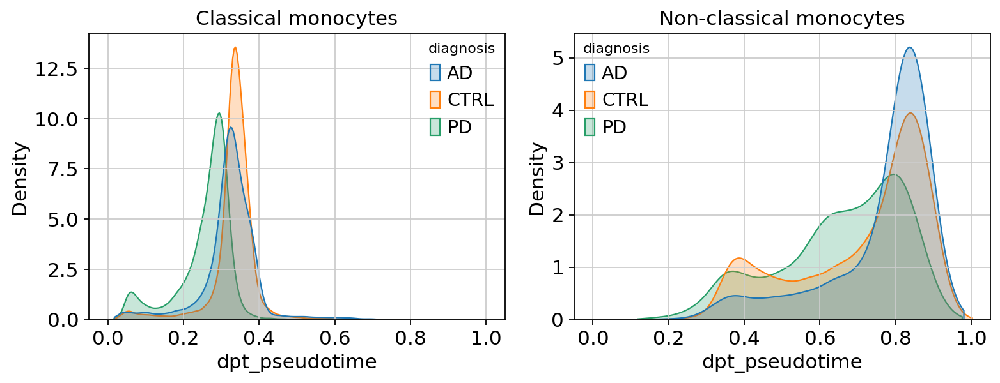

Classical monocytes: PD=18, CTRL=57 donors | median PD=0.287, CTRL=0.323 | MWU U=81, p=8.65e-08
Non-classical monocytes: PD=18, CTRL=56 donors | median PD=0.697, CTRL=0.791 | MWU U=195, p=0.000102


In [ ]:
# subgroup_col = "celltypist_cell_label_fine"     # or your manual leiden subclusters
# subgroups    = ["Classical monocytes", "Non-classical monocytes"]

# # ---- 1. Faceted density plot: PD vs CTRL WITHIN each subgroup ----
# fig, axes = plt.subplots(1, len(subgroups), figsize=(5 * len(subgroups), 4), sharex=True)
# for ax, sg in zip(axes, subgroups):
#     sub = adata_mono.obs[adata_mono.obs[subgroup_col] == sg]
#     sns.kdeplot(data=sub, x="dpt_pseudotime", hue="diagnosis",
#                 common_norm=False, fill=True, cut=0, ax=ax)   # cut=0: don't smear past [0,1]
#     ax.set_title(sg)
# plt.tight_layout(); plt.show()

# # ---- 2. Donor-level test WITHIN each subgroup (mirrors the plot) ----
# # one median per donor PER SUBGROUP  -> note groupby now has TWO keys
# per_donor_sg = (adata_mono.obs
#                 .groupby([subgroup_col, "sample_combined"], observed=True)
#                 .agg(median_pt=("dpt_pseudotime", "median"),
#                      diagnosis=("diagnosis", "first"),
#                      n_cells=("dpt_pseudotime", "size"))
#                 .reset_index())

# per_donor_sg = per_donor_sg[per_donor_sg["n_cells"] >= 20]   # drop unstable donor medians

# for sg in subgroups:
#     d = per_donor_sg[per_donor_sg[subgroup_col] == sg]
#     pd_vals   = d.loc[d.diagnosis == "PD",   "median_pt"]
#     ctrl_vals = d.loc[d.diagnosis == "CTRL", "median_pt"]
#     if len(pd_vals) < 3 or len(ctrl_vals) < 3:
#         print(f"{sg}: too few donors (PD={len(pd_vals)}, CTRL={len(ctrl_vals)}) — skip")
#         continue
#     U, p = mannwhitneyu(pd_vals, ctrl_vals, alternative="two-sided")
#     print(f"{sg}: PD={len(pd_vals)}, CTRL={len(ctrl_vals)} donors | "
#           f"median PD={pd_vals.median():.3f}, CTRL={ctrl_vals.median():.3f} | "
#           f"MWU U={U:.0f}, p={p:.3g}")


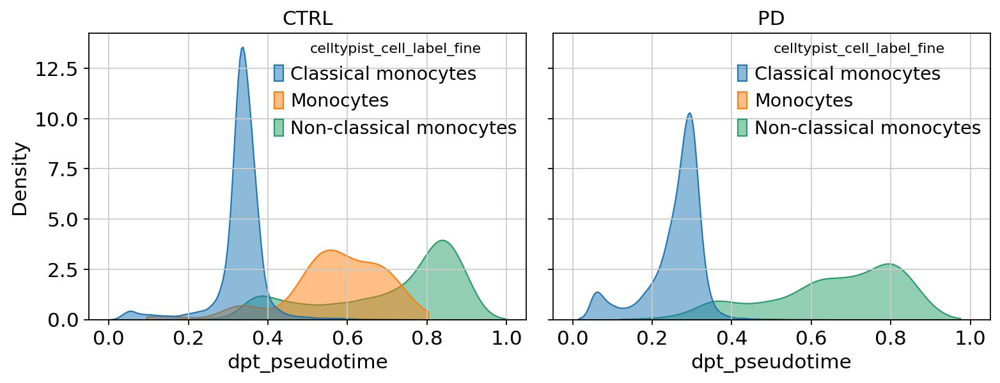

In [ ]:
# subgroup_col = "celltypist_cell_label_fine"     # or your manual leiden subclusters
# diseases     = ["CTRL", "PD"]                    # one panel each; CTRL first as baseline

# fig, axes = plt.subplots(1, len(diseases), figsize=(5 * len(diseases), 4),
#                          sharex=True, sharey=True)
# for ax, dz in zip(axes, diseases):
#     sub = adata_mono.obs[adata_mono.obs["diagnosis"] == dz]
#     sns.kdeplot(data=sub, x="dpt_pseudotime", hue=subgroup_col,
#                 common_norm=False, fill=True, cut=0, alpha=0.5, ax=ax)
#     ax.set_title(dz)
# plt.tight_layout(); plt.show()
